# Strategic Planning of Drones for Fire Services Using Location-allocation Analysis: A Case Study of Greater London
## CASA0004/0010：Dissertation 22/23
*Author: Shiding Zhang*<br>
*Time: 11/05/2023-25/08/2023*
***
#### About this document
- *The **data** I used comes from [London data](https://data.london.gov.uk/dataset/london-fire-brigade-incident-records), [Digimap](https://digimap.edina.ac.uk/) and [statistical gis boundaries london.](https://data.london.gov.uk/dataset/statistical-gis-boundary-files-london)*   
- *The code to use the method is from [the P-Median problem](https://github.com/pysal/spopt/blob/main/notebooks/p-median.ipynb) and [the maximal coverage location problem.](https://github.com/pysal/spopt/blob/main/notebooks/mclp.ipynb)*
- *I have uploaded the **raw data** and the **source code** for this assignment to Github, which you can find [Github.](https://github.com/ucfnsz3/Dissertation)*
***

# Import Packages

In [1]:
pip install watermark

Note: you may need to restart the kernel to use updated packages.


In [2]:
# 将绘图的图形格式设置为高分辨率，以获得更好的显示质量
%config InlineBackend.figure_format = "retina"
# 加载水印扩展，使 %watermark magic 命令能够显示计算环境的信息
%load_ext watermark
# 用于打印系统信息和软件包版本
%watermark

Last updated: 2023-08-21T15:47:23.394772+01:00

Python implementation: CPython
Python version       : 3.11.4
IPython version      : 8.14.0

Compiler    : GCC 12.2.0
OS          : Linux
Release     : 5.10.16.3-microsoft-standard-WSL2
Machine     : x86_64
Processor   : x86_64
CPU cores   : 20
Architecture: 64bit



In [3]:
# Python中科学计算的基础软件包，提供了对多维数组和矩阵的高效数值运算支持
import numpy as np
# 提供了高效处理结构化数据的数据结构和函数
import pandas as pd
import seaborn as sns
# 处理地理空间数据的python库，允许读取、写入、操作和分析地理空间数据
import geopandas as gpd

# 用于线性规划和优化的Python库。用于解决与位置分析相关的优化问题
import pulp
# 用于几何操作的Python库，用于空间操作和计算
import shapely
# 用于解决空间优化问题的Python库。它提供了解决位置分配问题的各种算法和方法
import spopt
# 是spopt库中的一个模块，包含不同位置分配算法的实现，包括LSCP（位置集覆盖问题）、LSCPB（位置集覆盖问题Benders）和MCLP（最大覆盖位置问题）
from spopt.locate import PMedian, simulated_geo_points
from spopt.locate import MCLP, simulated_geo_points 
# 是 spopt.locate 中的一个函数，用于生成模拟地理点
from shapely.geometry import Point

# 为地理空间可视化中的上下文背景制图提供了对基于网络的地图瓦片服务的轻松访问
import contextily as ctx

# python中广泛使用的绘图库，用于创建各种图
import matplotlib.pyplot as plt
# matplotlib库中的一个模块，提供各种形状和补丁
from matplotlib.patches import Patch
# 为自定义绘图提供了不同类型的线条和标记
import matplotlib.lines as mlines

# -w选项显示代码执行时间，-iv选项显示导入的软件包版本
%watermark -w
%watermark -iv

/tmp/ipykernel_128/338529319.py:7: DeprecationWarning: Shapely 2.0 is installed, but because PyGEOS is also installed, GeoPandas still uses PyGEOS by default. However, starting with version 0.14, the default will switch to Shapely. To force to use Shapely 2.0 now, you can either uninstall PyGEOS or set the environment variable USE_PYGEOS=0. You can do this before starting the Python process, or in your code before importing geopandas:

import os
os.environ['USE_PYGEOS'] = '0'
import geopandas

In the next release, GeoPandas will switch to using Shapely by default, even if PyGEOS is installed. If you only have PyGEOS installed to get speed-ups, this switch should be smooth. However, if you are using PyGEOS directly (calling PyGEOS functions on geometries from GeoPandas), this will then stop working and you are encouraged to migrate from PyGEOS to Shapely 2.0 (https://shapely.readthedocs.io/en/latest/migration_pygeos.html).
  import geopandas as gpd
/home/zhang/miniconda3/envs/sds2023/li

Watermark: 2.4.2

json      : 2.0.9
pulp      : 2.7.0
pandas    : 2.0.3
contextily: 1.3.0
spopt     : 0.5.1.dev41+gcac04eb
shapely   : 2.0.1
matplotlib: 3.7.1
geopandas : 0.13.2
sys       : 3.11.4 | packaged by conda-forge | (main, Jun 10 2023, 18:08:17) [GCC 12.2.0]
seaborn   : 0.12.2
numpy     : 1.23.5



In [4]:
import os

# Set the environment variable to force GeoPandas to use Shapely
os.environ['USE_PYGEOS'] = '0'

import geopandas as gpd

In [5]:
import gurobipy as gp
from gurobipy import GRB

connection_params = {
    "WLSACCESSID": "efeb461e-4fdd-4d61-942a-a22a93513818",
    "WLSSECRET": "a53d35f0-7262-4480-9c2f-cd545b9c2afb",
    "LICENSEID": 2382885,
    "WLSTokenDuration": 20, # 20 minutes token duration
}

with gp.Env(params=connection_params) as env:
    with gp.Model("my_model", env=env) as m:
    
        # Create variables
        x = m.addVar(vtype=GRB.BINARY, name="x")
        y = m.addVar(vtype=GRB.BINARY, name="y")
        z = m.addVar(vtype=GRB.BINARY, name="z")

        # Set objective
        m.setObjective(x + y + 2 * z, GRB.MAXIMIZE)

        # Add constraint: x + 2 y + 3 z <= 4
        m.addConstr(x + 2 * y + 3 * z <= 4, "c0")

        # Add constraint: x + y >= 1
        m.addConstr(x + y >= 1, "c1")

        # Optimize model
        m.optimize()

        for v in m.getVars():
            print('%s %g' % (v.VarName, v.X))

        print('Obj: %g' % m.ObjVal)

Set parameter WLSAccessID
Set parameter WLSSecret
Set parameter LicenseID to value 2382885
Set parameter WLSTokenDuration to value 20
Academic license - for non-commercial use only - registered to ucfnsz3@ucl.ac.uk
Gurobi Optimizer version 10.0.2 build v10.0.2rc0 (linux64)

CPU model: 12th Gen Intel(R) Core(TM) i7-12700H, instruction set [SSE2|AVX|AVX2]
Thread count: 10 physical cores, 20 logical processors, using up to 20 threads

Academic license - for non-commercial use only - registered to ucfnsz3@ucl.ac.uk
Optimize a model with 2 rows, 3 columns and 5 nonzeros
Model fingerprint: 0x98886187
Variable types: 0 continuous, 3 integer (3 binary)
Coefficient statistics:
  Matrix range     [1e+00, 3e+00]
  Objective range  [1e+00, 2e+00]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 4e+00]
Found heuristic solution: objective 2.0000000
Presolve removed 2 rows and 3 columns
Presolve time: 0.01s
Presolve: All rows and columns removed

Explored 0 nodes (0 simplex iterations) in

# 1. Import Data

In [81]:
# load london fire brigade incident records dataset
incident = pd.read_csv('https://raw.githubusercontent.com/ucfnsz3/Dissertation/main/LFB%20Incident%20data_2023.csv')
# load potential base stations dataset
potential_station = pd.read_csv('https://raw.githubusercontent.com/ucfnsz3/Dissertation/main/digimap_final.csv')

In [116]:
incident = pd.read_csv('LFB Incident data_2023.csv')

In [82]:
# 使用不到的数据列，数据中有很多空值，如果不删除，后面删除空值数据会少很多
incident = incident.drop(['SpecialServiceType'], axis=1)

In [83]:
# 需要经纬度信息，删除空值的点
incident = incident[(incident['Longitude'] != 0) & (incident['Latitude'] != 0)]

In [84]:
# delete the NaN or Null rows for vaccination
incident.dropna(inplace = True)
incident.sample(5)

,IncidentNumber,DateOfCall,CalYear,TimeOfCall,HourOfCall,IncidentGroup,StopCodeDescription,PropertyCategory,PropertyType,AddressQualifier,...,FirstPumpArriving_AttendanceTime,FirstPumpArriving_DeployedFromStation,SecondPumpArriving_AttendanceTime,SecondPumpArriving_DeployedFromStation,NumStationsWithPumpsAttending,NumPumpsAttending,PumpCount,PumpHoursRoundUp,Notional Cost (£),NumCalls
1495,002349-05012023,44931,2023,0.824850,19,Fire,Secondary Fire,Outdoor,Domestic garden (vegetation not equipment),On land associated with building,...,287.0,Clapham,446.0,Battersea,2.0,2.0,2.0,1.0,364.0,1
2821,004356-10012023,44936,2023,0.396389,9,False Alarm,False alarm - Good intent,Non Residential,Restaurant/cafe,Within same building,...,260.0,Soho,278.0,Euston,2.0,2.0,2.0,1.0,364.0,1
5406,008461-18012023,44944,2023,0.771794,18,False Alarm,AFA,Other Residential,Retirement/Old Persons Home,Correct incident location,...,270.0,Bethnal Green,421.0,Homerton,2.0,2.0,2.0,1.0,364.0,1
2247,003505-08012023,44934,2023,0.447454,10,False Alarm,False alarm - Good intent,Non Residential,Church/Chapel,Within same building,...,412.0,West Hampstead,413.0,Hendon,2.0,2.0,2.0,2.0,728.0,2
6965,010952-23012023,44949,2023,0.163090,3,False Alarm,False alarm - Good intent,Outdoor,Road surface/pavement,In street remote from gazetteer location,...,330.0,Leyton,397.0,Stratford,2.0,2.0,2.0,1.0,364.0,1


In [85]:
# 仅仅保留选择的警察局和消防局
potential_station = potential_station[potential_station['classname'] != 'Hospitals']

In [86]:
# check the shape
# 最后得到数据，需要分析1039个需求点和177个设施点
print(incident.shape)
print(potential_station.shape)

(1039, 38)
(177, 28)


# 2. Load Base Map

In [87]:
# set the filepath and load in a shapefile
fp = "London_Borough/London_Borough_Excluding_MHW.shp"

map_df = gpd.read_file(fp)

# check data type so we can see that this is not a normal dataframe, but a GEOdataframe
map_df.head()

,NAME,GSS_CODE,HECTARES,NONLD_AREA,ONS_INNER,SUB_2009,SUB_2006,geometry
0,Kingston upon Thames,E09000021,3726.117,0.000,F,NaN,NaN,"POLYGON ((516401.600 160201.800, 516407.300 16..."
1,Croydon,E09000008,8649.441,0.000,F,NaN,NaN,"POLYGON ((535009.200 159504.700, 535005.500 15..."
2,Bromley,E09000006,15013.487,0.000,F,NaN,NaN,"POLYGON ((540373.600 157530.400, 540361.200 15..."
3,Hounslow,E09000018,5658.541,60.755,F,NaN,NaN,"POLYGON ((521975.800 178100.000, 521967.700 17..."
4,Ealing,E09000009,5554.428,0.000,F,NaN,NaN,"POLYGON ((510253.500 182881.600, 510249.900 18..."


In [88]:
# Check the coordinate reference system (CRS) of the GeoDataFrame
crs = map_df.crs

# Print the CRS information
print("Coordinate Reference System (CRS):")
print(crs)

Coordinate Reference System (CRS):
PROJCS["OSGB36 / British National Grid",GEOGCS["OSGB36",DATUM["Ordnance_Survey_of_Great_Britain_1936",SPHEROID["Airy 1830",6377563.396,299.3249646,AUTHORITY["EPSG","7001"]],AUTHORITY["EPSG","6277"]],PRIMEM["Greenwich",0],UNIT["Degree",0.0174532925199433]],PROJECTION["Transverse_Mercator"],PARAMETER["latitude_of_origin",49],PARAMETER["central_meridian",-2],PARAMETER["scale_factor",0.999601272],PARAMETER["false_easting",400000],PARAMETER["false_northing",-100000],UNIT["metre",1,AUTHORITY["EPSG","9001"]],AXIS["Easting",EAST],AXIS["Northing",NORTH]]


In [89]:
# Convert the NAME column to uppercase
map_df.NAME = map_df.NAME.str.upper()

In [90]:
# Calculate the area for each feature using the area attribute
map_df['area'] = map_df.geometry.area

In [91]:
# Load the LFB incident data and filter for the desired year and columns
df_1 = incident[incident['CalYear'] == 2023][['IncidentNumber', 'IncGeo_BoroughName']]
df_1

,IncidentNumber,IncGeo_BoroughName
0,000001-01012023,EALING
7,000013-01012023,LAMBETH
11,000018-01012023,ENFIELD
12,000021-01012023,CROYDON
13,000024-01012023,HAMMERSMITH AND FULHAM
...,...,...
9857,015571-31012023,WESTMINSTER
9861,015583-31012023,LEWISHAM
9862,015586-31012023,WANDSWORTH
9863,015587-31012023,WESTMINSTER


In [92]:
# Group by 'IncGeo_BoroughName' and count the incidents for each borough
df_2 = df_1.groupby('IncGeo_BoroughName', as_index=False)['IncidentNumber'].count()
# Sort the DataFrame in descending order based on the 'IncidentNumber' column
df_2 = df_2.sort_values(by='IncidentNumber', ascending=False)
# Display the modified DataFrame
df_2

,IncGeo_BoroughName,IncidentNumber
32,WESTMINSTER,85
7,CROYDON,59
5,CAMDEN,51
21,LAMBETH,50
16,HILLINGDON,49
27,SOUTHWARK,41
18,ISLINGTON,40
30,WALTHAM FOREST,37
29,TOWER HAMLETS,36
3,BRENT,34


In [93]:
# Merge the incident count data with the map data
merged = map_df.set_index('NAME').join(df_2.set_index('IncGeo_BoroughName'))

# Convert area from square meters to square kilometers
merged['area_km2'] = merged['area'] / 1000000  # Divide by 1,000,000 to convert from square meters to square kilometers

# Calculate the callouts per unit area  (in Square Kilometers)
# merged['callouts_per_area'] = merged['IncidentNumber'] / merged['area']
# Calculate the callouts per unit area in square kilometers
merged['callouts_per_area'] = merged['IncidentNumber'] / merged['area_km2']

# Sort the DataFrame based on the 'callouts_per_area' column in descending order
# ascending=False：以降序排列
sorted_merged = merged.sort_values(by='callouts_per_area', ascending=False)

# Display the specific columns in the sorted DataFrame
columns_to_display = ['GSS_CODE', 'callouts_per_area']

sorted_merged[columns_to_display]

,GSS_CODE,callouts_per_area
NAME,,
CITY OF LONDON,E09000001,6.198506
WESTMINSTER,E09000033,3.955885
ISLINGTON,E09000019,2.692397
CAMDEN,E09000007,2.340599
HAMMERSMITH AND FULHAM,E09000013,2.073472
LAMBETH,E09000022,1.864973
TOWER HAMLETS,E09000030,1.820210
KENSINGTON AND CHELSEA,E09000020,1.732123
SOUTHWARK,E09000028,1.420551


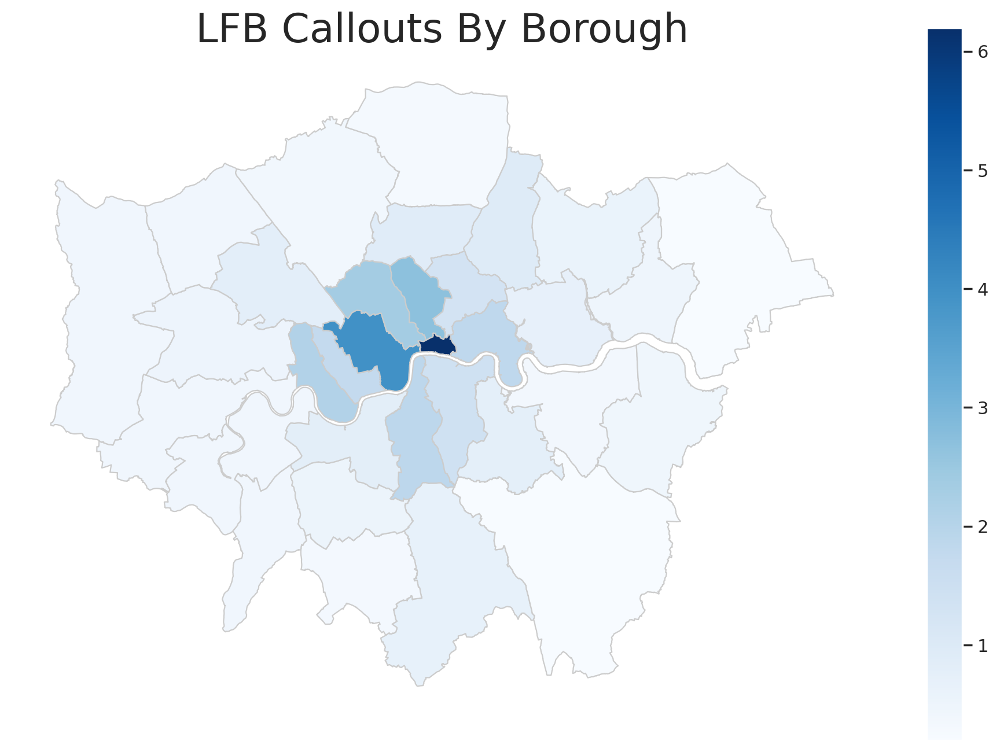

In [94]:
# 创建地图，表示伦敦每个行政区单位面积内的呼叫次数（callouts_per_area）

# set variables
variable = 'callouts_per_area'

# set the range for the choropleth
vmin, vmax = merged[variable].min(), merged[variable].max()

# create figure and axes for Matplotlib
fig, ax = plt.subplots(1, figsize=(12, 8))

# create map
merged.plot(column=variable, cmap='Blues', linewidth=0.8, ax=ax, edgecolor='0.8')

# Now we can customise and add annotations

# remove the axis
ax.axis('off')

# add a title
ax.set_title('LFB Callouts By Borough', \
              fontdict={'fontsize': '25',
                        'fontweight' : '3'})

# create an annotation for the  data source
#ax.annotate('Source: London Datastore, 2023',
           #xy=(0.1, .08), xycoords='figure fraction',
           #horizontalalignment='left', verticalalignment='top',
           #fontsize=10, color='#555555')

# Create colorbar as a legend
sm = plt.cm.ScalarMappable(cmap='Blues', norm=plt.Normalize(vmin=vmin, vmax=vmax))
sm._A = []
cbar = fig.colorbar(sm, ax=ax)  # Explicitly provide 'ax' parameter to avoid the warning

# this will save the figure as a high-res png. you can also save as svg
#fig.savefig('London_Borough/images/calloutsmap.png', dpi=300)

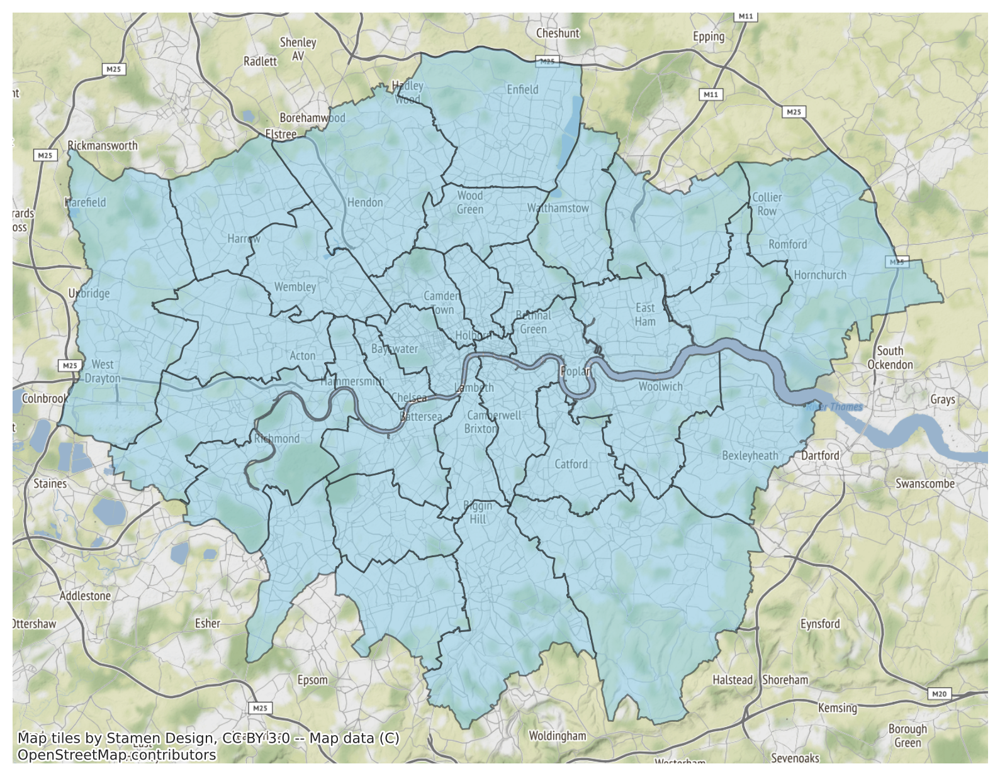

In [95]:
# Convert the merged dataframe to the desired CRS
# OpenStreetMap，默认使用网络墨卡托投影（EPSG:3857）
background = merged.to_crs(epsg=3857)

# alpha controls the transparency of the polygons (0.5 means semi-transparent), 
# edgecolor sets the color of the boundary lines of the polygons, 
# and color sets the fill color of the polygons
ax = background.plot(figsize=(10, 10), alpha=0.5, edgecolor='k', color='skyblue')

# Add a basemap using contextily to provide additional map context
ctx.add_basemap(ax)

# Remove the x and y axis tick labels
ax.set_xticks([])
ax.set_yticks([])

# Remove the surrounding black border line
ax.axis('off')

plt.show()

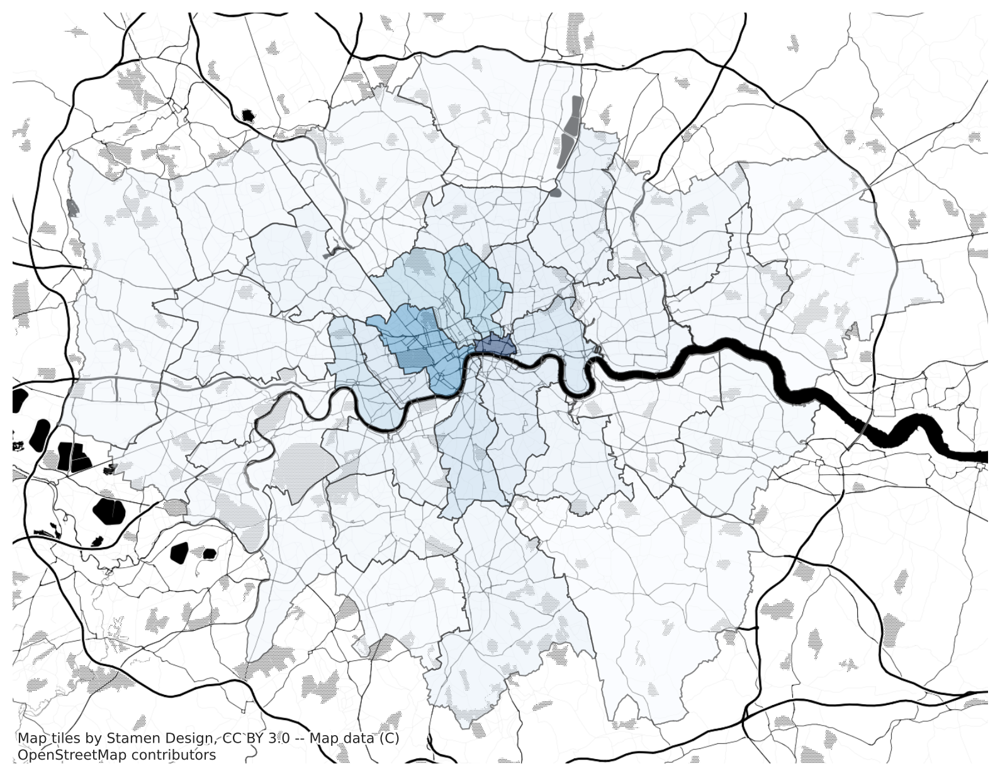

In [96]:
# Convert the merged dataframe to the desired CRS
# OpenStreetMap，默认使用网络墨卡托投影（EPSG:3857）
background = merged.to_crs(epsg=3857)

# Define the desired map provider (in this case, Stamen Toner, which is a black and white map style)
map_provider = ctx.providers.Stamen.TonerBackground

# Create the basemap using the desired map provider
ax = background.plot(figsize=(10, 10), alpha=0.5, column=variable, cmap='Blues', linewidth=0.8, edgecolor='k')
ctx.add_basemap(ax, crs=background.crs, source=map_provider)

# Remove the x and y axis tick labels
ax.set_xticks([])
ax.set_yticks([])

# Remove the surrounding black border line
ax.axis('off')

plt.show()

# 4. P-Median Problem

In [24]:
# 根据无人机性能确定一些参数
drone_speed = 55500 # Drone speed in meters/h
maximum_service_time = 38  # minutes
max_response_time_minutes = 6 # max response time in minutes

# max flight distance in miles
max_flight_distance_miles = 35150 # meters
max_response_distance = 5550 # meters

In [25]:
# from pulp import GUROBI

# 设施点需要服务或覆盖的地点数量
CLIENT_COUNT_PM = len(incident)

# 设施点数量
FACILITY_COUNT_PM = len(potential_station)

# 表示生成需求点或客户位置的随机种子。随机种子用于确保生成点的可重复性
CLIENT_SEED = 5
# 表示生成供应点或潜在设施位置的随机种子
FACILITY_SEED = 6

# 用于设置优化问题的求解器
solver = pulp.GUROBI(msg=False, warmStart=True, params=connection_params)

Set parameter WLSAccessID
Set parameter WLSSecret
Set parameter LicenseID to value 2382885
Academic license - for non-commercial use only - registered to ucfnsz3@ucl.ac.uk


In [26]:
# 使用经纬度坐标分别为每个incident和potential_station创建点对象
# 将点对象列表转换为 GeoDataFrame
client_geometry_PM = [Point(xy) for xy in zip(incident['Longitude'], incident['Latitude'])]
client_points_PM = gpd.GeoDataFrame(incident, geometry = client_geometry_PM)

facility_geometry_PM = [Point(xy) for xy in zip(potential_station['Longitude'], potential_station['Latitude'])]
facility_points_PM = gpd.GeoDataFrame(potential_station, geometry = facility_geometry_PM)

In [27]:
# 设置WGS84坐标参考系
# 转换client_points_PM和facility_points_PM的CRS，使之与map_df对象的CRS相匹配
client_points_PM.crs = 'EPSG:4326'
client_points_PM = client_points_PM.to_crs(map_df.crs)

facility_points_PM.crs = 'EPSG:4326'
facility_points_PM = facility_points_PM.to_crs(map_df.crs)

In [28]:
# 检查坐标系
print(client_points_PM.crs)
print(facility_points_PM.crs)

PROJCS["OSGB36 / British National Grid",GEOGCS["OSGB36",DATUM["Ordnance_Survey_of_Great_Britain_1936",SPHEROID["Airy 1830",6377563.396,299.3249646,AUTHORITY["EPSG","7001"]],AUTHORITY["EPSG","6277"]],PRIMEM["Greenwich",0],UNIT["Degree",0.0174532925199433]],PROJECTION["Transverse_Mercator"],PARAMETER["latitude_of_origin",49],PARAMETER["central_meridian",-2],PARAMETER["scale_factor",0.999601272],PARAMETER["false_easting",400000],PARAMETER["false_northing",-100000],UNIT["metre",1,AUTHORITY["EPSG","9001"]],AXIS["Easting",EAST],AXIS["Northing",NORTH]]
PROJCS["OSGB36 / British National Grid",GEOGCS["OSGB36",DATUM["Ordnance_Survey_of_Great_Britain_1936",SPHEROID["Airy 1830",6377563.396,299.3249646,AUTHORITY["EPSG","7001"]],AUTHORITY["EPSG","6277"]],PRIMEM["Greenwich",0],UNIT["Degree",0.0174532925199433]],PROJECTION["Transverse_Mercator"],PARAMETER["latitude_of_origin",49],PARAMETER["central_meridian",-2],PARAMETER["scale_factor",0.999601272],PARAMETER["false_easting",400000],PARAMETER["false_n

In [29]:
# 创建了一个 NumPy 数组 ai，长度由变量 CLIENT_COUNT_PM 定义，每个元素的权重值都设置为 1 表示所有事件点在分析中具有同等重要性或权重
ai = np.ones(CLIENT_COUNT_PM, dtype = int)
client_points_PM["weights"] = ai

In [30]:
# 从client_points_PM和facility_points_PM这两个GeoDataFrames中提取经度 (x) 和纬度 (y) 值，并使用这些提取的坐标创建NumPy数组dem_data 和 fac_data

# Extract x (longitude) and y (latitude) values from client_points_PM GeoDataFrame
dem_x = client_points_PM.geometry.x.to_numpy()
dem_y = client_points_PM.geometry.y.to_numpy()

# Extract x (longitude) and y (latitude) values from facility_points_PM GeoDataFrame
fac_x = facility_points_PM.geometry.x.to_numpy()
fac_y = facility_points_PM.geometry.y.to_numpy()

# Create dem_data and fac_data arrays using the extracted x and y values
dem_data = np.array([dem_x, dem_y]).T
fac_data = np.array([fac_x, fac_y]).T

In [31]:
# 计算两组点之间的距离矩阵

from spopt.locate import PMedian
from scipy.spatial.distance import cdist #scipy.spatial.distance 模块中的 cdist 函数，用于计算两组点之间的成对距离

# 使用欧几里得距离来测量点与点之间的距离
distance_metric = "euclidean"

# Compute the distance matrix using the cdist function
distances = cdist(dem_data, fac_data, distance_metric)

# 生成的2维NumPy数组distances[i, j] ，表示 dem_data 中第 i 个点与 fac_data 中第 j 个点之间的距离
distances

array([[ 5052.81582089, 28135.87582991, 30561.54691568, ...,
         5413.13961372, 24301.29763925, 12076.00109566],
       [11546.24321074, 17200.17342848, 14388.78411466, ...,
        13630.8834197 , 11466.1402947 ,  8657.54859488],
       [23820.02611806, 34846.23582072, 17632.77616546, ...,
        28528.08700641,  9085.61952724, 16215.58649155],
       ...,
       [ 9118.40909827, 15555.19660234, 21433.49451693, ...,
         8014.33411703, 19140.30736389, 11979.03410796],
       [ 9536.9711562 , 20222.37644069, 15979.2073062 , ...,
        12644.01768732, 10885.7718136 ,  5493.9888512 ],
       [21927.41147434,  6553.06185661, 25650.18832614, ...,
        19082.40576605, 28121.22638449, 24665.09198474]])

## Substitute the modified matrix into the model and add capacity constraints, assuming that the capacity of each of the selected facility points is equally distributed, substituting the minimum capacity that will satisfy the demand.

In [32]:
distances_2 = distances.copy()

# Preprocess the distance matrix
distances_2[distances > max_response_distance] = 1e9  # Set large value for distances beyond max_response_distance
distances_2

array([[5.05281582e+03, 1.00000000e+09, 1.00000000e+09, ...,
        5.41313961e+03, 1.00000000e+09, 1.00000000e+09],
       [1.00000000e+09, 1.00000000e+09, 1.00000000e+09, ...,
        1.00000000e+09, 1.00000000e+09, 1.00000000e+09],
       [1.00000000e+09, 1.00000000e+09, 1.00000000e+09, ...,
        1.00000000e+09, 1.00000000e+09, 1.00000000e+09],
       ...,
       [1.00000000e+09, 1.00000000e+09, 1.00000000e+09, ...,
        1.00000000e+09, 1.00000000e+09, 1.00000000e+09],
       [1.00000000e+09, 1.00000000e+09, 1.00000000e+09, ...,
        1.00000000e+09, 1.00000000e+09, 5.49398885e+03],
       [1.00000000e+09, 1.00000000e+09, 1.00000000e+09, ...,
        1.00000000e+09, 1.00000000e+09, 1.00000000e+09]])

In [33]:
# 'math' 用于在 Python 中执行各种数学运算和计算
import math

list_pmedian_3 = []  # 创建一个空列表，用于存储 PMedian 平均距离结果

for p in range(1, 178):
    # 根据无人机在选定设施中的均匀分布计算无人机容量
    facility_capacity = len(incident) / p  # Division without rounding
    if not facility_capacity.is_integer():  # 检查结果是否不是整数
        facility_capacity = math.ceil(facility_capacity)  # 使用 math.ceil 对容量进行四舍五入，以确保每个设施都有足够的容量为客户提供服务

    # use the facility_capacities array in the PMedian.from_cost_matrix function
    pmedian_from_cm_3 = PMedian.from_cost_matrix(
        distances_2,
        ai,
        p_facilities = p,
        facility_capacities = [facility_capacity] * p,  # 根据选定设施的数量进行调整
        name = "p-median-euclidean-distance"
    )
    
    # 使用指定的求解器求解 PMedian 问题。然后计算需求点到指定设施的平均距离，并四舍五入到小数点后三位
    pmedian_from_cm_3 = pmedian_from_cm_3.solve(solver)
    pmp_mean_3 = round(pmedian_from_cm_3.mean_dist, 3)
    list_pmedian_3.append((p, facility_capacity, pmp_mean_3))

    # Print the mean distance result for the current value of p and its corresponding facility capacity
    print(f"For p = {p}, facility_capacity = {facility_capacity}, mean distance is {pmp_mean_3} meters.")

For p = 1, facility_capacity = 1039.0, mean distance is 723773737.693 meters.
For p = 2, facility_capacity = 520, mean distance is 604428806.179 meters.
For p = 3, facility_capacity = 347, mean distance is 525507062.106 meters.
For p = 4, facility_capacity = 260, mean distance is 453322506.377 meters.
For p = 5, facility_capacity = 208, mean distance is 386912713.497 meters.
For p = 6, facility_capacity = 174, mean distance is 336864582.98 meters.
For p = 7, facility_capacity = 149, mean distance is 291628977.431 meters.
For p = 8, facility_capacity = 130, mean distance is 248318257.789 meters.
For p = 9, facility_capacity = 116, mean distance is 209819910.826 meters.
For p = 10, facility_capacity = 104, mean distance is 177096243.632 meters.
For p = 11, facility_capacity = 95, mean distance is 146297561.721 meters.
For p = 12, facility_capacity = 87, mean distance is 116461285.157 meters.
For p = 13, facility_capacity = 80, mean distance is 92399503.491 meters.
For p = 14, facility_ca

In [35]:
df_pmedian_3 = pd.DataFrame(list_pmedian_3, columns=['p', 'facility_capacity', 'pmp_mean_3'])
df_pmedian_3

,p,facility_capacity,pmp_mean_3
0,1,1039.0,7.237737e+08
1,2,520.0,6.044288e+08
2,3,347.0,5.255071e+08
3,4,260.0,4.533225e+08
4,5,208.0,3.869127e+08
...,...,...,...
172,173,7.0,1.291763e+03
173,174,6.0,1.488384e+03
174,175,6.0,1.488346e+03
175,176,6.0,1.503436e+03


In [36]:
# Assuming you have already created the DataFrame df_pmedian

# Find the maximum value of the 'pmp_mean' column
max_pmp_mean_3 = df_pmedian_3['pmp_mean_3'].max()

# Find the minimum value of the 'pmp_mean' column
min_pmp_mean_3 = df_pmedian_3['pmp_mean_3'].min()

# Print the maximum and minimum values
print("Maximum pmp_mean:", max_pmp_mean_3)
print("Minimum pmp_mean:", min_pmp_mean_3)

Maximum pmp_mean: 723773737.693
Minimum pmp_mean: 1176.909


## Selection of p ≥ 24

In [37]:
# Delete the rows where p takes values from 1 to 23
df_pmedian_4 = df_pmedian_3.loc[df_pmedian_3['p'] > 23]

# Reset the index of the DataFrame after deleting rows
df_pmedian_4.reset_index(drop=True, inplace=True)

# Display the resulting DataFrame
df_pmedian_4

,p,facility_capacity,pmp_mean_3
0,24,44.0,2805.448
1,25,42.0,2656.160
2,26,40.0,2548.843
3,27,39.0,2438.747
4,28,38.0,2374.877
...,...,...,...
149,173,7.0,1291.763
150,174,6.0,1488.384
151,175,6.0,1488.346
152,176,6.0,1503.436


In [38]:
# Assuming you have already created the DataFrame df_pmedian

# Find the maximum value of the 'pmp_mean' column
max_pmp_mean_4 = df_pmedian_4['pmp_mean_3'].max()

# Find the minimum value of the 'pmp_mean' column
min_pmp_mean_4 = df_pmedian_4['pmp_mean_3'].min()

# Print the maximum and minimum values
print("Maximum pmp_mean:", max_pmp_mean_4)
print("Minimum pmp_mean:", min_pmp_mean_4)

Maximum pmp_mean: 2805.448
Minimum pmp_mean: 1176.909


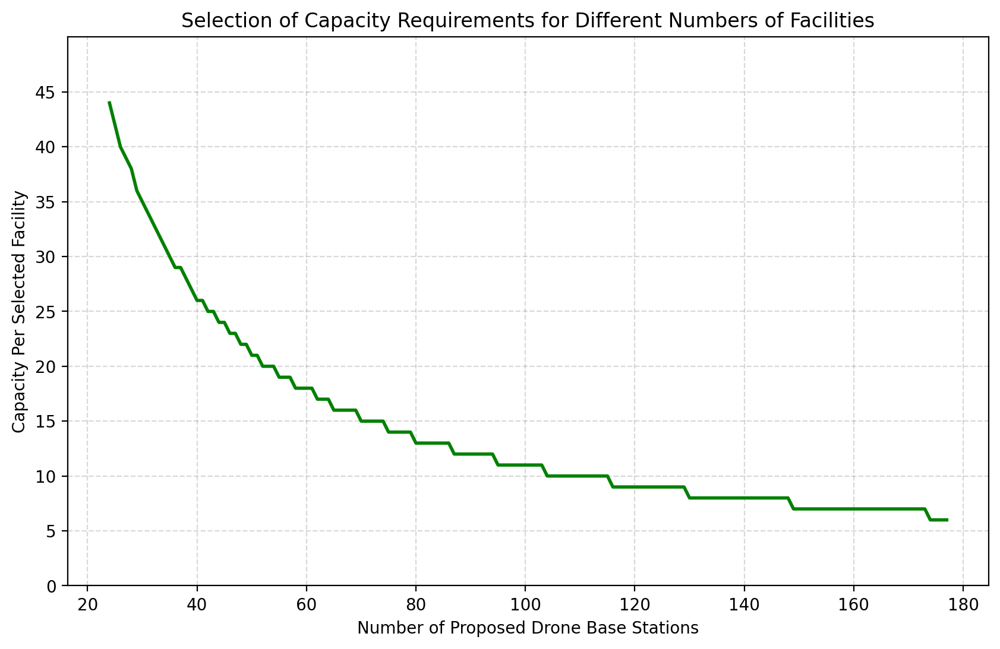

In [36]:
# Plotting the graph
fig, ax = plt.subplots(figsize = (10, 6))

# Set the y-axis limits and ticks
plt.ylim(0, 50)
plt.yticks(range(0, 50, 5))

ax.set_title('Selection of Capacity Requirements for Different Numbers of Facilities')
ax.plot(df_pmedian_4['p'], df_pmedian_4['facility_capacity'], color = 'green', linestyle = '-', linewidth = 2)
ax.grid(color = 'grey', linestyle = '--', alpha = 0.3)
ax.set_xlabel('Number of Proposed Drone Base Stations')
ax.set_ylabel('Capacity Per Selected Facility')

plt.show()

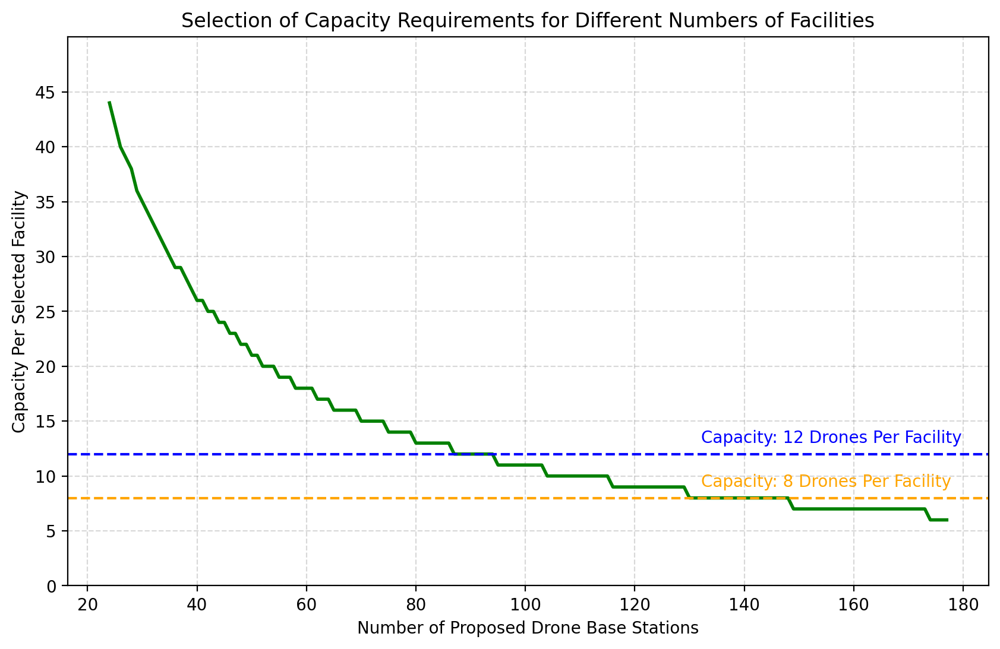

In [37]:
# Plotting the graph
fig, ax = plt.subplots(figsize = (10, 6))

# Set the y-axis limits and ticks
plt.ylim(0, 50)
plt.yticks(range(0, 50, 5))

ax.set_title('Selection of Capacity Requirements for Different Numbers of Facilities')
ax.plot(df_pmedian_4['p'], df_pmedian_4['facility_capacity'], color = 'green', linestyle = '-', linewidth = 2)
ax.grid(color = 'grey', linestyle = '--', alpha = 0.3)
ax.set_xlabel('Number of Proposed Drone Base Stations')
ax.set_ylabel('Capacity Per Selected Facility')

# Add the red dotted line at y=5550 and label it
plt.axhline(y = 12, color = 'blue', linestyle = '--', label = 'Capacity: 12 Drones Per Facility')
ax.annotate("Capacity: 12 Drones Per Facility", xy = (120, 13), xytext = (40, 0),
            textcoords = "offset points", color = 'blue', fontsize = 10)
# Add the red dotted line at y=5550 and label it
plt.axhline(y = 8, color = 'orange', linestyle = '--', label = 'Capacity: 8 Drones Per Facility')
ax.annotate("Capacity: 8 Drones Per Facility", xy = (120, 9), xytext = (40, 0),
            textcoords = "offset points", color = 'orange', fontsize = 10)

plt.show()

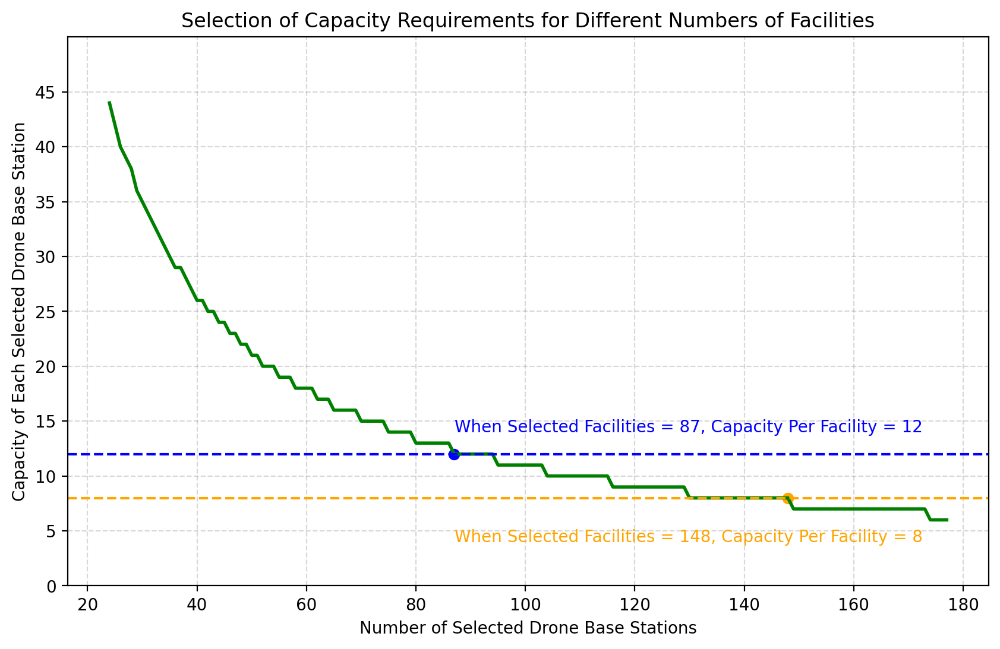

In [73]:
# Plotting the graph
fig, ax = plt.subplots(figsize = (10, 6))

# Set the y-axis limits and ticks
plt.ylim(0, 50)
plt.yticks(range(0, 50, 5))

ax.set_title('Selection of Capacity Requirements for Different Numbers of Facilities')
ax.plot(df_pmedian_4['p'], df_pmedian_4['facility_capacity'], color = 'green', linestyle = '-', linewidth = 2)
ax.grid(color = 'grey', linestyle = '--', alpha = 0.3)
ax.set_xlabel('Number of Selected Drone Base Stations')
ax.set_ylabel('Capacity of Each Selected Drone Base Station')

# Add the red dotted line at y=5550 and label it
plt.axhline(y = 12, color = 'blue', linestyle='--', label='When Selected Facilities = 87, Capacity Per Facility = 12')
ax.annotate("When Selected Facilities = 87, Capacity Per Facility = 12", xy = (75, 14), xytext = (40, 0),
            textcoords = "offset points", color = 'blue', fontsize=10)
# Add the red dotted line at y=5550 and label it
plt.axhline(y = 8, color = 'orange', linestyle = '--', label = 'When Selected Facilities = 148, Capacity Per Facility = 8')
ax.annotate("When Selected Facilities = 148, Capacity Per Facility = 8", xy = (75, 4), xytext = (40, 0),
            textcoords = "offset points", color = 'orange', fontsize = 10)

# Mark the position on the graph
target_p_value_1 = 87
target_distance_1 = 12
ax.scatter(target_p_value_1, target_distance_1, color='blue')
target_p_value_2 = 148
target_distance_2 = 8
ax.scatter(target_p_value_2, target_distance_2, color='orange')

plt.show()

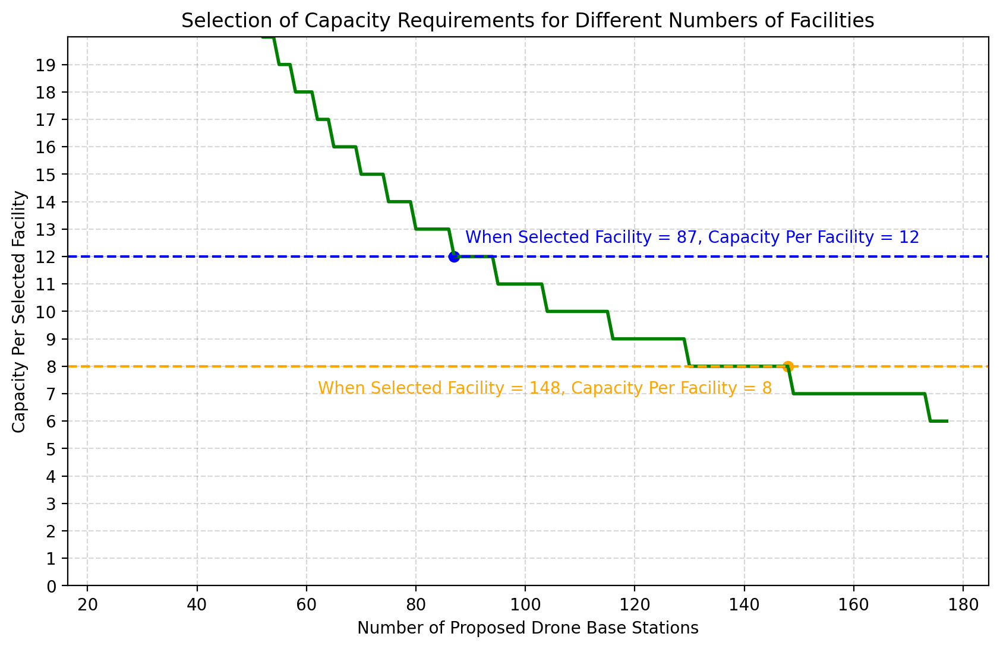

In [39]:
# Plotting the graph
fig, ax = plt.subplots(figsize = (10, 6))

# Set the y-axis limits and ticks
plt.ylim(0, 20)
plt.yticks(range(0, 20, 1))

ax.set_title('Selection of Capacity Requirements for Different Numbers of Facilities')
ax.plot(df_pmedian_4['p'], df_pmedian_4['facility_capacity'], color = 'green', linestyle = '-', linewidth = 2)
ax.grid(color = 'grey', linestyle = '--', alpha = 0.3)
ax.set_xlabel('Number of Proposed Drone Base Stations')
ax.set_ylabel('Capacity Per Selected Facility')

# Add the red dotted line at y=5550 and label it
plt.axhline(y = 12, color = 'blue', linestyle = '--', label = 'When Selected Facilities = 87, Capacity Per Facility = 12')
ax.annotate("When Selected Facility = 87, Capacity Per Facility = 12", xy = (77, 12.5), xytext = (40, 0),
            textcoords="offset points", color = 'blue', fontsize=10)
# Add the red dotted line at y=5550 and label it
plt.axhline(y = 8, color = 'orange', linestyle = '--', label = 'When Selected Facilities = 148, Capacity Per Facility = 8')
ax.annotate("When Selected Facility = 148, Capacity Per Facility = 8", xy = (50, 7), xytext = (40, 0),
            textcoords = "offset points", color='orange', fontsize = 10)

# Mark the position on the graph
target_p_value_1 = 87
target_distance_1 = 12
ax.scatter(target_p_value_1, target_distance_1, color='blue')
target_p_value_2 = 148
target_distance_2 = 8
ax.scatter(target_p_value_2, target_distance_2, color='orange')

plt.show()

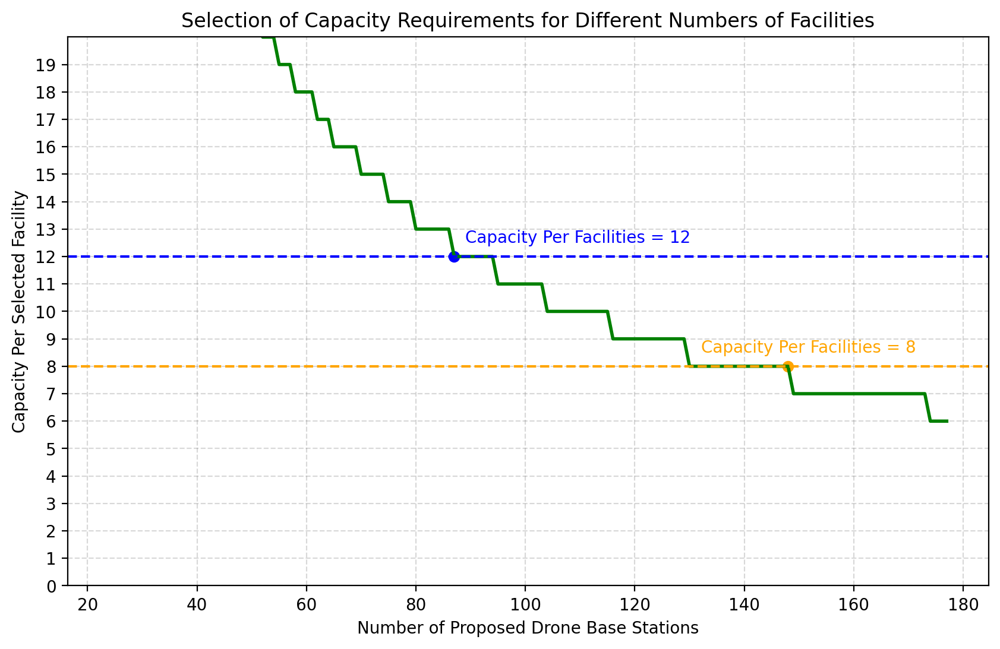

In [40]:
# Plotting the graph
fig, ax = plt.subplots(figsize = (10, 6))

# Set the y-axis limits and ticks
plt.ylim(0, 20)
plt.yticks(range(0, 20, 1))

ax.set_title('Selection of Capacity Requirements for Different Numbers of Facilities')
ax.plot(df_pmedian_4['p'], df_pmedian_4['facility_capacity'], color = 'green', linestyle = '-', linewidth = 2)
ax.grid(color = 'grey', linestyle = '--', alpha = 0.3)
ax.set_xlabel('Number of Proposed Drone Base Stations')
ax.set_ylabel('Capacity Per Selected Facility')

# Add the red dotted line at y=5550 and label it
plt.axhline(y = 12, color = 'blue', linestyle = '--', label = 'Capacity Per Facilities = 12')
ax.annotate("Capacity Per Facilities = 12", xy = (77, 12.5), xytext = (40, 0),
            textcoords = "offset points", color = 'blue', fontsize = 10)
# Add the red dotted line at y=5550 and label it
plt.axhline(y = 8, color = 'orange', linestyle = '--', label = 'Capacity Per Facilities = 8')
ax.annotate("Capacity Per Facilities = 8", xy = (120, 8.5), xytext = (40, 0),
            textcoords = "offset points", color = 'orange', fontsize = 10)

# Mark the position on the graph
target_p_value_1 = 87
target_distance_1 = 12
ax.scatter(target_p_value_1, target_distance_1, color='blue')
target_p_value_2 = 148
target_distance_2 = 8
ax.scatter(target_p_value_2, target_distance_2, color='orange')

plt.show()

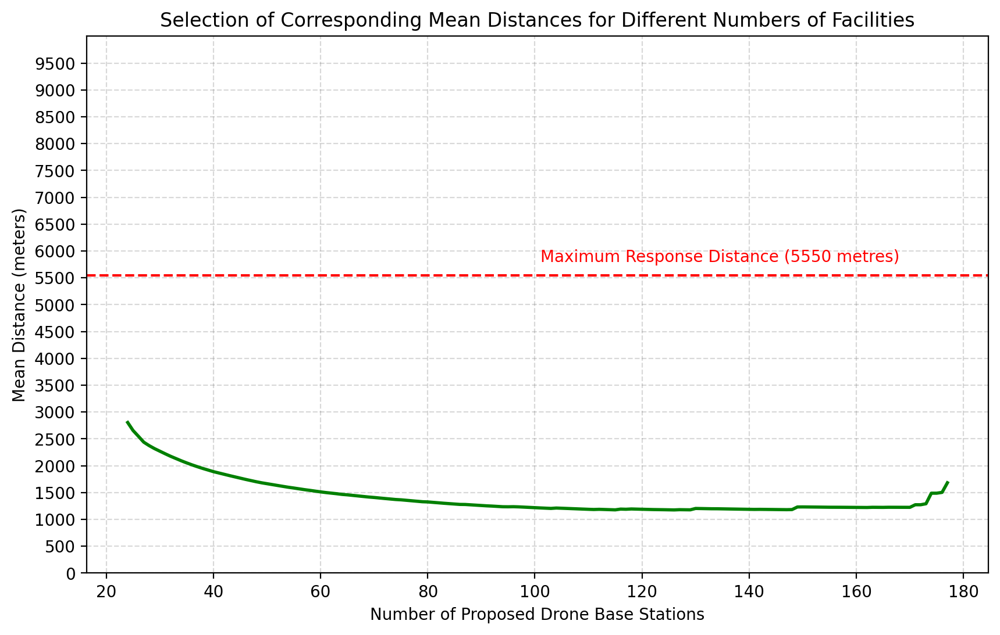

In [41]:
# Plotting the graph
fig, ax = plt.subplots(figsize = (10, 6))

# Set the y-axis limits and ticks
plt.ylim(0, 10000)
plt.yticks(range(0, 10000, 500))

ax.set_title('Selection of Corresponding Mean Distances for Different Numbers of Facilities')
ax.plot(df_pmedian_4['p'], df_pmedian_4['pmp_mean_3'], color = 'green', linestyle = '-', linewidth = 2)
ax.grid(color = 'grey', linestyle = '--', alpha = 0.3)
ax.set_xlabel('Number of Proposed Drone Base Stations')
ax.set_ylabel('Mean Distance (meters)')

# Add the red dotted line at y=5550 and label it
plt.axhline(y = 5550, color = 'red', linestyle = '--', label = 'Maximum Response Distance (5550 metres)')
ax.annotate("Maximum Response Distance (5550 metres)", xy = (89, 5800), xytext = (40, 0),
            textcoords = "offset points", color = 'red', fontsize = 10)

plt.show()

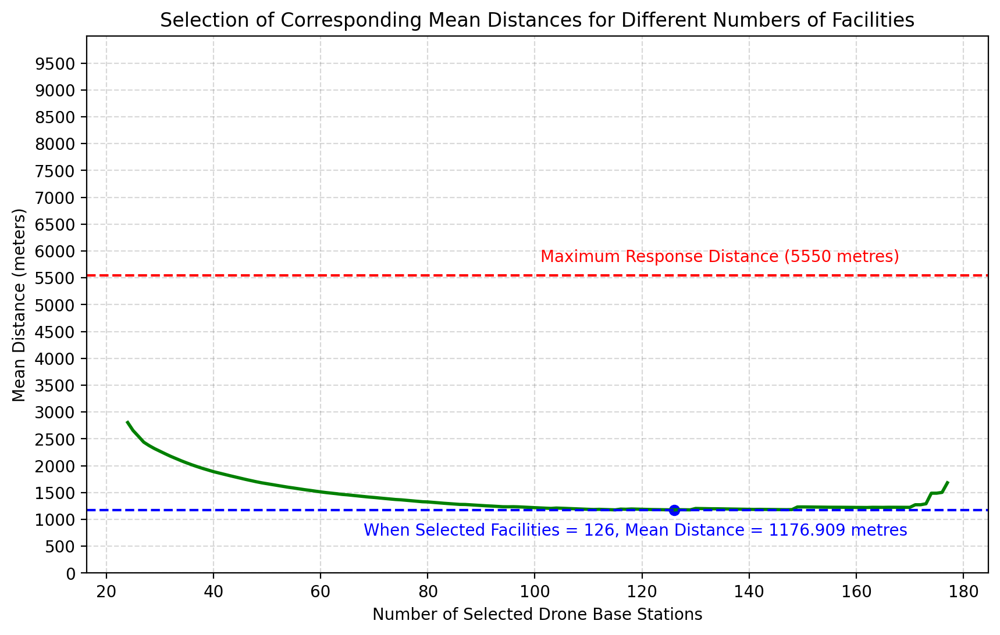

In [45]:
# Plotting the graph
fig, ax = plt.subplots(figsize = (10, 6))

# Set the y-axis limits and ticks
plt.ylim(0, 10000)
plt.yticks(range(0, 10000, 500))

ax.set_title('Selection of Corresponding Mean Distances for Different Numbers of Facilities')
ax.plot(df_pmedian_4['p'], df_pmedian_4['pmp_mean_3'], color = 'green', linestyle = '-', linewidth = 2)
ax.grid(color = 'grey', linestyle = '--', alpha = 0.3)
ax.set_xlabel('Number of Selected Drone Base Stations')
ax.set_ylabel('Mean Distance (meters)')

# Add the red dotted line at y=5550 and label it
plt.axhline(y = 5550, color = 'red', linestyle = '--', label = 'Maximum Response Distance (5550 metres)')
ax.annotate("Maximum Response Distance (5550 metres)", xy = (89, 5800), xytext = (40, 0),
            textcoords = "offset points", color = 'red', fontsize = 10)

# Add the red dotted line at y=5550 and label it
plt.axhline(y = 1176.909, color = 'blue', linestyle = '--', label = 'When Selected Facilities = 126, Mean Distance = 1176.909 metres')
ax.annotate("When Selected Facilities = 126, Mean Distance = 1176.909 metres", xy = (56, 700), xytext = (40, 0),
            textcoords = "offset points", color = 'blue', fontsize = 10)

# Mark the position on the graph
target_p_value_1 = 126
target_distance_1 = 1176.909
ax.scatter(target_p_value_1, target_distance_1, color='blue')

plt.show()

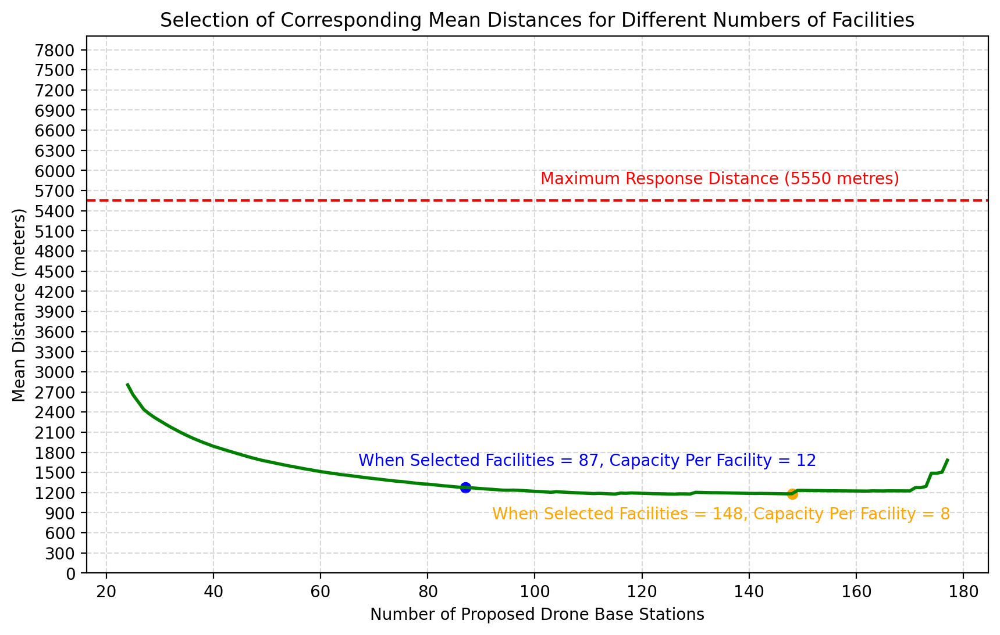

In [44]:
# Plotting the graph
fig, ax = plt.subplots(figsize = (10, 6))

# Set the y-axis limits and ticks
plt.ylim(0, 8000)
plt.yticks(range(0, 8000, 300))

ax.set_title('Selection of Corresponding Mean Distances for Different Numbers of Facilities')
ax.plot(df_pmedian_4['p'], df_pmedian_4['pmp_mean_3'], color = 'green', linestyle = '-', linewidth = 2)
ax.grid(color='grey', linestyle = '--', alpha = 0.3)
ax.set_xlabel('Number of Proposed Drone Base Stations')
ax.set_ylabel('Mean Distance (meters)')

# Add the red dotted line at y=5550 and label it
plt.axhline(y = 5550, color = 'red', linestyle = '--', label = 'Maximum Response Distance (5550 metres)')
ax.annotate("Maximum Response Distance (5550 metres)", xy = (89, 5800), xytext = (40, 0),
            textcoords = "offset points", color = 'red', fontsize = 10)

# Add the red dotted line at y=5550 and label it
#plt.axhline(y = 1278.117, color = 'blue', linestyle = '--', label = 'When Selected Facilities = 87, Capacity Per Facility = 12')
ax.annotate("When Selected Facilities = 87, Capacity Per Facility = 12", xy=(55, 1600), xytext=(40, 0),
            textcoords = "offset points", color = 'blue', fontsize = 10)
# Add the red dotted line at y=5550 and label it
#plt.axhline(y = 1183.549, color = 'orange', linestyle='--', label='When Selected Facilities = 148, Capacity Per Facility = 8')
ax.annotate("When Selected Facilities = 148, Capacity Per Facility = 8", xy = (80, 800), xytext = (40, 0),
            textcoords = "offset points", color = 'orange', fontsize = 10)

# Mark the position on the graph
target_p_value_1 = 87
target_distance_1 = 1278.117
ax.scatter(target_p_value_1, target_distance_1, color='blue')
target_p_value_2 = 148
target_distance_2 = 1183.549
ax.scatter(target_p_value_2, target_distance_2, color='orange')

plt.show()

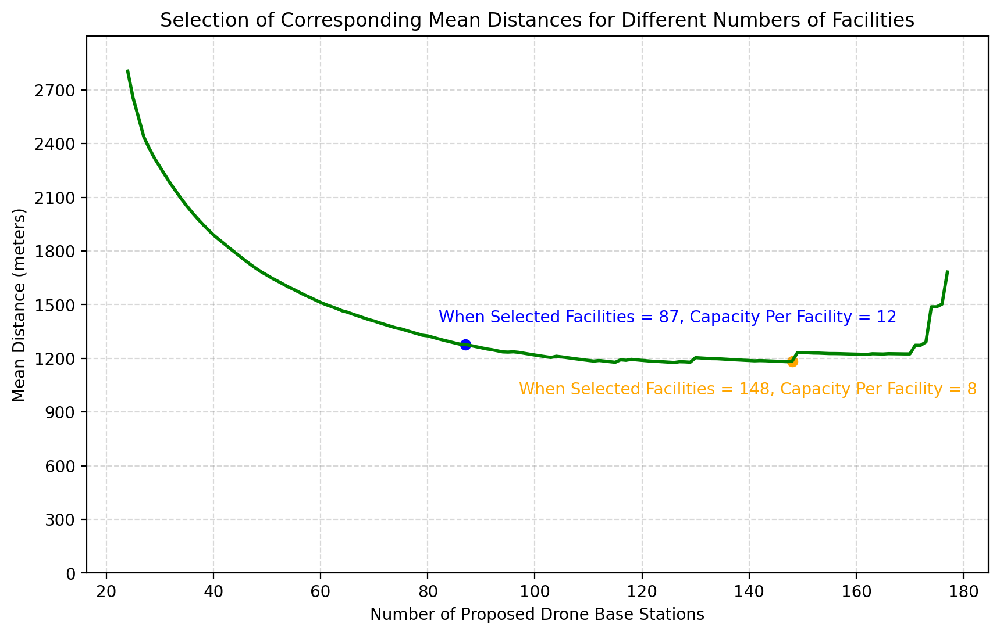

In [45]:
# Plotting the graph
fig, ax = plt.subplots(figsize = (10, 6))

# Set the y-axis limits and ticks
plt.ylim(0, 3000)
plt.yticks(range(0, 3000, 300))

ax.set_title('Selection of Corresponding Mean Distances for Different Numbers of Facilities')
ax.plot(df_pmedian_4['p'], df_pmedian_4['pmp_mean_3'], color = 'green', linestyle = '-', linewidth = 2)
ax.grid(color = 'grey', linestyle = '--', alpha = 0.3)
ax.set_xlabel('Number of Proposed Drone Base Stations')
ax.set_ylabel('Mean Distance (meters)')

# Add the red dotted line at y=5550 and label it
plt.axhline(y = 5550, color = 'red', linestyle = '--', label = 'Maximum Response Distance (5550 metres)')
ax.annotate("Maximum Response Distance (5550 metres)", xy = (89, 5800), xytext = (40, 0),
            textcoords = "offset points", color = 'red', fontsize = 10)

# Add the red dotted line at y=5550 and label it
#plt.axhline(y = 1278.117, color = 'blue', linestyle = '--', label = 'When Selected Facilities = 87, Capacity Per Facility = 12')
ax.annotate("When Selected Facilities = 87, Capacity Per Facility = 12", xy = (70, 1400), xytext = (40, 0),
            textcoords = "offset points", color = 'blue', fontsize = 10)
# Add the red dotted line at y=5550 and label it
#plt.axhline(y = 1183.549, color = 'orange', linestyle = '--', label = 'When Selected Facilities = 148, Capacity Per Facility = 8')
ax.annotate("When Selected Facilities = 148, Capacity Per Facility = 8", xy = (85, 1000), xytext = (40, 0),
            textcoords = "offset points", color = 'orange', fontsize = 10)

# Mark the position on the graph
target_p_value_1 = 87
target_distance_1 = 1278.117
ax.scatter(target_p_value_1, target_distance_1, color='blue')
target_p_value_2 = 148
target_distance_2 = 1183.549
ax.scatter(target_p_value_2, target_distance_2, color='orange')

plt.show()

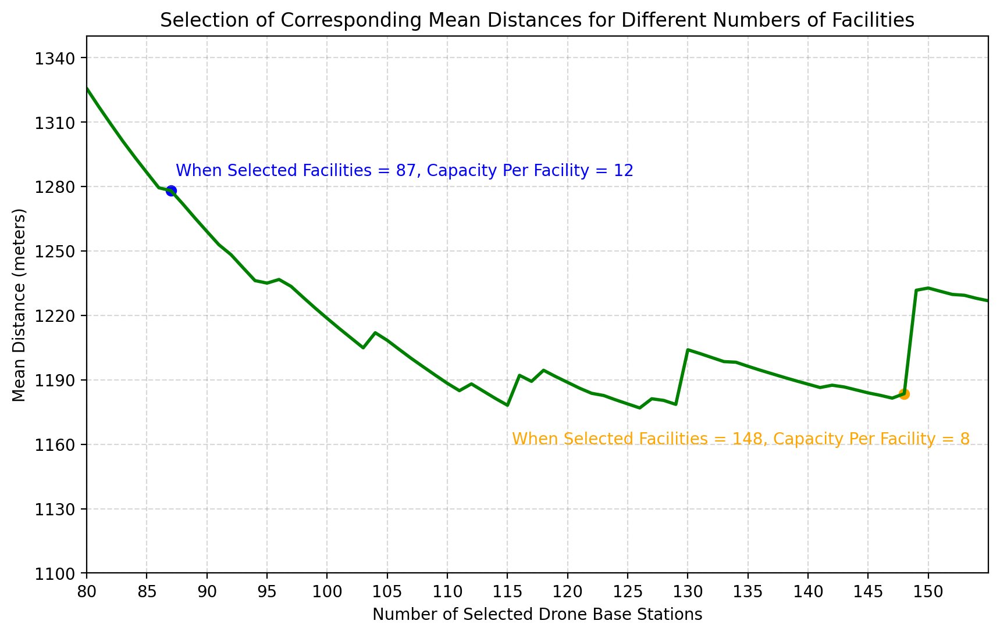

In [47]:
fig, ax = plt.subplots(figsize = (10, 6))

# Set the y-axis limits and ticks
plt.ylim(1100, 1350)
plt.yticks(range(1100, 1350, 30))
plt.xlim(80, 155)
plt.xticks(range(80, 155, 5))

ax.set_title('Selection of Corresponding Mean Distances for Different Numbers of Facilities')
ax.plot(df_pmedian_4['p'], df_pmedian_4['pmp_mean_3'], color = 'green', linestyle = '-', linewidth = 2)
ax.grid(color = 'grey', linestyle = '--', alpha = 0.3)
ax.set_xlabel('Number of Selected Drone Base Stations')
ax.set_ylabel('Mean Distance (meters)')

# Add the red dotted line at y=5550 and label it
plt.axhline(y = 5550, color = 'red', linestyle = '--', label = 'Maximum Response Distance (5550 metres)')
ax.annotate("Maximum Response Distance (5550 metres)", xy = (89, 5800), xytext = (40, 0),
            textcoords = "offset points", color = 'red', fontsize = 10)

# Add the red dotted line at y=1278.117 and label it
#plt.axhline(y = 1278.117, color = 'blue', linestyle = '--', label = 'When Selected Facilities = 87, Capacity Per Facility = 12')
ax.annotate("When Selected Facilities = 87, Capacity Per Facility = 12", xy = (82, 1285), xytext = (40, 0),
            textcoords = "offset points", color = 'blue', fontsize = 10)

# Add the red dotted line at y=1183.549 and label it
#plt.axhline(y = 1183.549, color='orange', linestyle = '--', label = 'When Selected Facilities = 148, Capacity Per Facility = 8')
ax.annotate("When Selected Facilities = 148, Capacity Per Facility = 8", xy = (110, 1160), xytext = (40, 0),
            textcoords = "offset points", color = 'orange', fontsize = 10)

# Mark the position on the graph
target_p_value_1 = 87
target_distance_1 = 1278.117
ax.scatter(target_p_value_1, target_distance_1, color='blue')

target_p_value_2 = 148
target_distance_2 = 1183.549
ax.scatter(target_p_value_2, target_distance_2, color='orange')

plt.show()

## Visualisation of the results of choosing P=126

In [50]:
import math

# Calculate the UAV capacity based on even distribution of UAVs among selected facilities
facility_capacity = len(incident) / P_FACILITIES_PM  # Division without rounding
if not facility_capacity.is_integer():  # Check if the result is not a whole number
    facility_capacity = math.ceil(facility_capacity)  # Round up if not a whole number

# Print the calculated facility capacity for the fixed value of p
print("For p =", P_FACILITIES_PM, ", facility_capacity =", facility_capacity)

For p = 126 , facility_capacity = 9


In [51]:
pmedian_from_cm = PMedian.from_cost_matrix(
    distances_2,
    ai,
    p_facilities=P_FACILITIES_PM,
    facility_capacities=[facility_capacity] * P_FACILITIES_PM,  # Adjusted to match the number of selected facilities
    name="p-median-distance"
)

In [52]:
pmedian_from_cm = pmedian_from_cm.solve(solver)
pmedian_from_cm

In [53]:
pmp_obj = round(pmedian_from_cm.problem.objective.value(), 3)
pmp_mean = round(pmedian_from_cm.mean_dist, 3)
print(
    f"A total minimized weighted distance of {pmp_obj} meters is "
    f"observed, with a mean distance of {pmp_mean} meters per individual client."
)

A total minimized weighted distance of 1222808.288 meters is observed, with a mean distance of 1176.909 meters per individual client.


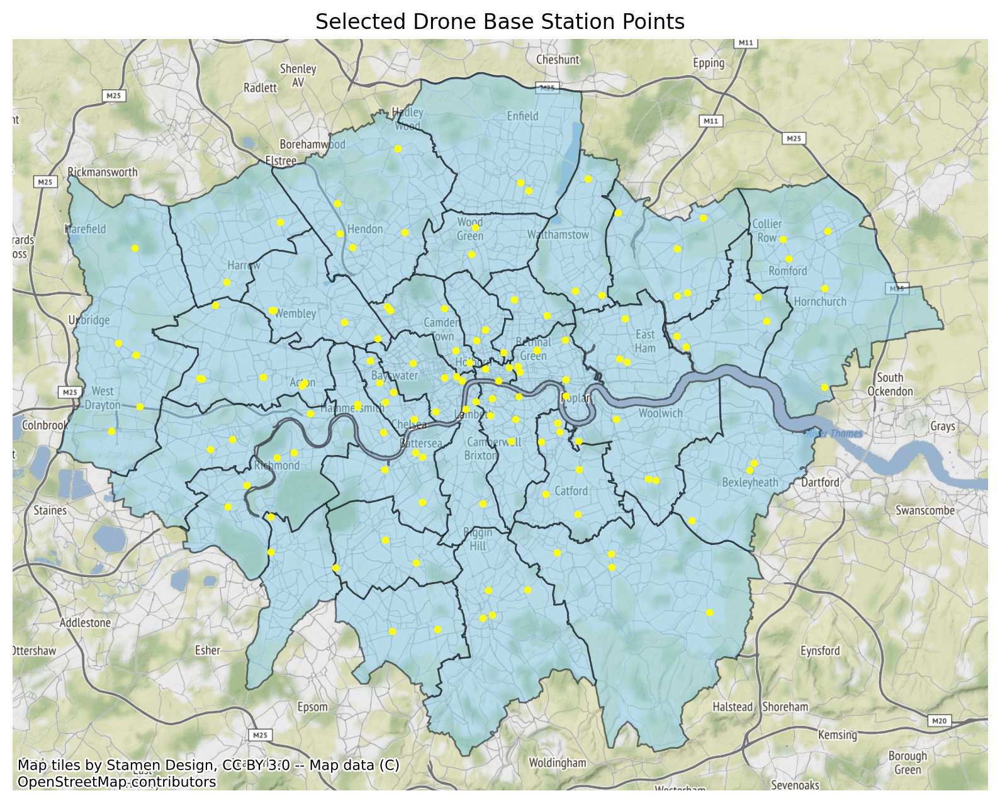

In [54]:
import matplotlib.pyplot as plt

# Set the coordinate system of the base station points to match the background map
facility_points_selected_PM = facility_points_PM.sample(n=P_FACILITIES_PM, random_state=FACILITY_SEED)
# Convert the base station points to EPSG 3875 (Web Mercator) projection
facility_points_selected_PM = facility_points_selected_PM.to_crs(epsg=3857)

# Plot the final map with base station points
fig, ax = plt.subplots(figsize=(10, 10))

# Plot the background map
background.plot(ax=ax, alpha=0.5, edgecolor='k', color='skyblue')
ctx.add_basemap(ax)

# Plot the base station points as solid yellow origin points
facility_points_selected_PM.plot(ax=ax, color='yellow', marker='o', markersize=10)

# Remove the x and y axis labels
ax.set_xticks([])
ax.set_yticks([])

# Remove the surrounding black border line
ax.axis('off')

ax.set_title('Selected Drone Base Station Points')

# Display the map
plt.show()

# 5. The Maximal Coverage Location Problem

In [55]:
drone_speed = 55500 # Drone speed in m/h
maximum_service_time = 38  # minutes
max_response_time_minutes = 6 # Maximum response time in minutes

# Maximum flight distance in miles
max_flight_distance_miles = 35150 # m
max_response_distance = 5550 # m

In [56]:
#from pulp import GUROBI

# 设施点需要服务或覆盖的地点数量
CLIENT_COUNT_MCLP = len(incident)

# 设施点数量
FACILITY_COUNT_MCLP = len(potential_station)

# 定义了最优解中包含的候选设施数量
P_FACILITIES_MCLP = 24

# 定义了设施的最大服务半径或覆盖距离
SERVICE_RADIUS = max_response_distance

# Random seeds for reproducibility
# 表示生成需求点或客户位置的随机种子。随机种子用于确保生成点的可重复性
CLIENT_SEED = 5
# 表示生成供应点或潜在设施位置的随机种子
FACILITY_SEED = 6

# 用于设置优化问题的求解器
solver = pulp.GUROBI(msg=False, warmStart=True, params=connection_params)

In [57]:
# Convert incident points to GeoDataFrame
client_geometry_MCLP = [Point(xy) for xy in zip(incident['Longitude'], incident['Latitude'])]
client_points_MCLP = gpd.GeoDataFrame(incident, geometry=client_geometry_MCLP)

# Convert potential_station points to GeoDataFrame
facility_geometry_MCLP = [Point(xy) for xy in zip(potential_station['Longitude'], potential_station['Latitude'])]
facility_points_MCLP = gpd.GeoDataFrame(potential_station, geometry=facility_geometry_MCLP)

In [58]:
# Set CRS
client_points_MCLP.crs = 'EPSG:4326'
client_points_MCLP = client_points_MCLP.to_crs(map_df.crs)

facility_points_MCLP.crs = 'EPSG:4326'
facility_points_MCLP = facility_points_MCLP.to_crs(map_df.crs)

In [59]:
# 检查坐标系
print(client_points_PM.crs)
print(facility_points_PM.crs)

PROJCS["OSGB36 / British National Grid",GEOGCS["OSGB36",DATUM["Ordnance_Survey_of_Great_Britain_1936",SPHEROID["Airy 1830",6377563.396,299.3249646,AUTHORITY["EPSG","7001"]],AUTHORITY["EPSG","6277"]],PRIMEM["Greenwich",0],UNIT["Degree",0.0174532925199433]],PROJECTION["Transverse_Mercator"],PARAMETER["latitude_of_origin",49],PARAMETER["central_meridian",-2],PARAMETER["scale_factor",0.999601272],PARAMETER["false_easting",400000],PARAMETER["false_northing",-100000],UNIT["metre",1,AUTHORITY["EPSG","9001"]],AXIS["Easting",EAST],AXIS["Northing",NORTH]]
PROJCS["OSGB36 / British National Grid",GEOGCS["OSGB36",DATUM["Ordnance_Survey_of_Great_Britain_1936",SPHEROID["Airy 1830",6377563.396,299.3249646,AUTHORITY["EPSG","7001"]],AUTHORITY["EPSG","6277"]],PRIMEM["Greenwich",0],UNIT["Degree",0.0174532925199433]],PROJECTION["Transverse_Mercator"],PARAMETER["latitude_of_origin",49],PARAMETER["central_meridian",-2],PARAMETER["scale_factor",0.999601272],PARAMETER["false_easting",400000],PARAMETER["false_n

In [60]:
ai = np.ones(CLIENT_COUNT_MCLP, dtype=int)
client_points_MCLP["weights"] = ai

In [62]:
# 从client_points_PM和facility_points_PM这两个GeoDataFrames中提取经度 (x) 和纬度 (y) 值，并使用这些提取的坐标创建NumPy数组dem_data 和 fac_data

# Extract x (longitude) and y (latitude) values from client_points_PM GeoDataFrame
dem_x = client_points_PM.geometry.x.to_numpy()
dem_y = client_points_PM.geometry.y.to_numpy()

# Extract x (longitude) and y (latitude) values from facility_points_PM GeoDataFrame
fac_x = facility_points_PM.geometry.x.to_numpy()
fac_y = facility_points_PM.geometry.y.to_numpy()

# Create dem_data and fac_data arrays using the extracted x and y values
dem_data = np.array([dem_x, dem_y]).T
fac_data = np.array([fac_x, fac_y]).T

In [63]:
# 计算两组点之间的距离矩阵

from spopt.locate import PMedian
from scipy.spatial.distance import cdist #scipy.spatial.distance 模块中的 cdist 函数，用于计算两组点之间的成对距离

# 使用欧几里得距离来测量点与点之间的距离
distance_metric = "euclidean"

# Compute the distance matrix using the cdist function
distances = cdist(dem_data, fac_data, distance_metric)

# 生成的2维NumPy数组distances[i, j] ，表示 dem_data 中第 i 个点与 fac_data 中第 j 个点之间的距离
distances

array([[ 5052.81582089, 28135.87582991, 30561.54691568, ...,
         5413.13961372, 24301.29763925, 12076.00109566],
       [11546.24321074, 17200.17342848, 14388.78411466, ...,
        13630.8834197 , 11466.1402947 ,  8657.54859488],
       [23820.02611806, 34846.23582072, 17632.77616546, ...,
        28528.08700641,  9085.61952724, 16215.58649155],
       ...,
       [ 9118.40909827, 15555.19660234, 21433.49451693, ...,
         8014.33411703, 19140.30736389, 11979.03410796],
       [ 9536.9711562 , 20222.37644069, 15979.2073062 , ...,
        12644.01768732, 10885.7718136 ,  5493.9888512 ],
       [21927.41147434,  6553.06185661, 25650.18832614, ...,
        19082.40576605, 28121.22638449, 24665.09198474]])

In [64]:
list_mclp = []  # List to store MCLP coverage results

for p in range(1, 178):
    mclp_from_gdf = MCLP.from_geodataframe(
        client_points_MCLP,
        facility_points_MCLP,
        "geometry",
        "geometry",
        "weights",
        SERVICE_RADIUS,
        p_facilities=p,
        distance_metric=distance_metric,
        name=f"MCLP-{distance_metric}-distance"
    )
    mclp_from_gdf = mclp_from_gdf.solve(solver)
    coverage = mclp_from_gdf.perc_cov
    list_mclp.append((p, round(coverage, 2)))

# Print the coverage results for different values of p
for p, coverage in list_mclp:
    print(f"For p = {p}, coverage is {coverage}%")

For p = 1, coverage is 27.62%
For p = 2, coverage is 39.56%
For p = 3, coverage is 47.45%
For p = 4, coverage is 54.67%
For p = 5, coverage is 61.31%
For p = 6, coverage is 66.31%
For p = 7, coverage is 70.84%
For p = 8, coverage is 75.17%
For p = 9, coverage is 79.02%
For p = 10, coverage is 82.29%
For p = 11, coverage is 85.37%
For p = 12, coverage is 88.35%
For p = 13, coverage is 90.76%
For p = 14, coverage is 93.26%
For p = 15, coverage is 94.71%
For p = 16, coverage is 96.15%
For p = 17, coverage is 97.21%
For p = 18, coverage is 97.98%
For p = 19, coverage is 98.65%
For p = 20, coverage is 99.04%
For p = 21, coverage is 99.42%
For p = 22, coverage is 99.71%
For p = 23, coverage is 99.9%
For p = 24, coverage is 100.0%
For p = 25, coverage is 100.0%
For p = 26, coverage is 100.0%
For p = 27, coverage is 100.0%
For p = 28, coverage is 100.0%
For p = 29, coverage is 100.0%
For p = 30, coverage is 100.0%
For p = 31, coverage is 100.0%
For p = 32, coverage is 100.0%
For p = 33, covera

In [65]:
df_mclp = pd.DataFrame(list_mclp, columns=['p', 'coverage'])
print(df_mclp)

       p  coverage
0      1     27.62
1      2     39.56
2      3     47.45
3      4     54.67
4      5     61.31
..   ...       ...
172  173    100.00
173  174    100.00
174  175    100.00
175  176    100.00
176  177    100.00

[177 rows x 2 columns]


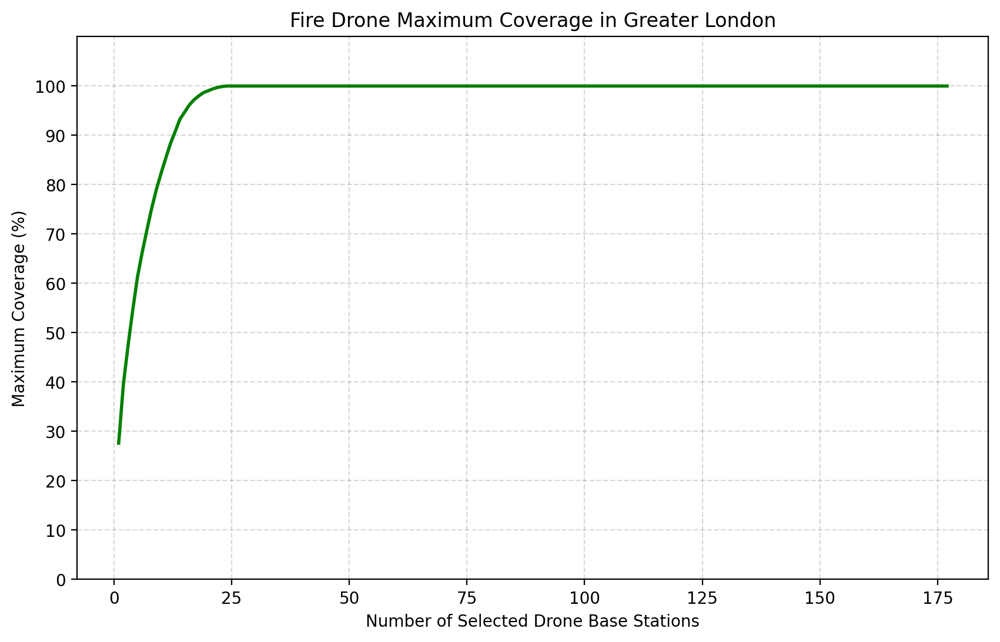

In [66]:
import matplotlib.pyplot as plt

fig, ax = plt.subplots(figsize=(10, 6))

# Set the y-axis limits and ticks
plt.ylim(0, max(df_mclp['coverage']) + 10)
plt.yticks(range(0, int(max(df_mclp['coverage'])) + 10, 10))

ax.set_title('Fire Drone Maximum Coverage in Greater London')
ax.plot(df_mclp['p'], df_mclp['coverage'], color='green', linestyle='-', linewidth=2)
ax.grid(color='grey', linestyle='--', alpha=0.3)
ax.set_xlabel('Number of Selected Drone Base Stations')
ax.set_ylabel('Maximum Coverage (%)')

# Add scatter points or any other customizations

plt.show()

## Visualisation of the results of choosing P=24

In [67]:
distance_metric_MCLP = "euclidean"

client_points_MCLP["weights"] = client_points_MCLP["weights"]
mclp_from_gdf = MCLP.from_geodataframe(
    client_points_MCLP,
    facility_points_MCLP,
    "geometry",
    "geometry",
    "weights",
    SERVICE_RADIUS,
    p_facilities=P_FACILITIES_MCLP,
    distance_metric=distance_metric_MCLP,
    name=f"MCLP-{distance_metric_MCLP}-distance"
)

In [68]:
mclp_from_gdf = mclp_from_gdf.solve(solver)
print(f"{mclp_from_gdf.perc_cov}% coverage is observed")

100.0% coverage is observed


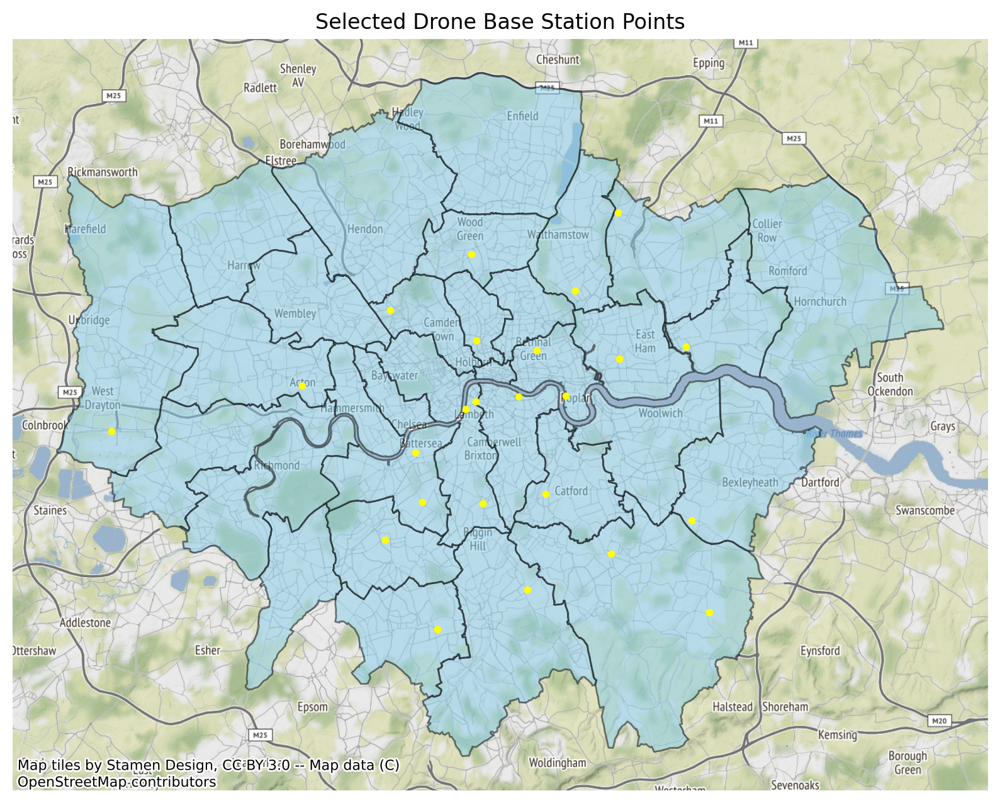

In [69]:
import matplotlib.pyplot as plt

# Set the coordinate system of the base station points to match the background map
facility_points_selected_MCLP = facility_points_MCLP.sample(n=P_FACILITIES_MCLP, random_state=FACILITY_SEED)

# Convert the base station points to EPSG 3875 (Web Mercator) projection
facility_points_selected_MCLP = facility_points_selected_MCLP.to_crs(epsg=3857)

# Plot the final map with base station points
fig, ax = plt.subplots(figsize=(10, 10))

# Plot the background map
background.plot(ax=ax, alpha=0.5, edgecolor='k', color='skyblue')
ctx.add_basemap(ax)

# Plot the base station points as solid yellow origin points
facility_points_selected_MCLP.plot(ax=ax, color='yellow', marker='o', markersize=10)

# Remove the x and y axis labels
ax.set_xticks([])
ax.set_yticks([])

# Remove the surrounding black border line
ax.axis('off')

ax.set_title('Selected Drone Base Station Points')

# Display the map
plt.show()